ref: https://morris-lab.github.io/CellOracle.documentation/notebooks/04_Network_analysis/Network_analysis_with_Paul_etal_2015_data.html

# Import libraries

In [1]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns

import matplotlib as mpl
# enables correct plotting of text
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42 

In [2]:
import celloracle as co
co.__version__

'0.20.0'

In [3]:
import importlib.util
import sys
spec = importlib.util.spec_from_file_location("module.name", "/nfs/team205/kk18/function/python/utils.py")
utils = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = utils
spec.loader.exec_module(utils)

spec = importlib.util.spec_from_file_location("module.name", "/nfs/team205/kk18/function/python/regulon_plot.py")
regulon_plot = importlib.util.module_from_spec(spec)
sys.modules["module.name"] = regulon_plot
spec.loader.exec_module(regulon_plot)

In [4]:
sc.settings.set_figure_params(dpi=120)

In [5]:
%matplotlib inline

# Parameters

In [6]:
!ls /nfs/team205/heart/anndata_objects/Foetal/celloracle

archive_AtrialCM-Left_in-silico_perturbation_May2025.pkl
archive_AtrialCM-Right_in-silico_perturbation_May2025.pkl
AtrialCM_in-silico_perturbation_May2025.pkl
AtrialCM-Right_in-silico_perturbation_May2025.pkl
figures_pm
foetal_AtrialCM.celloracle.oracle
foetal_AtrialCM_links.celloracle.links


In [7]:
# Parameters
# working_dir = "/nfs/team205/heart/Vitro/TF_selection/foetal_vCM_left_compact-vs-trabeculated_downstream/CO_in-silico-perturbation_papermill"
path_to_oracle_object = "/nfs/team205/heart/anndata_objects/Foetal/celloracle/foetal_AtrialCM.celloracle.oracle"
path_to_oracle_links = "/nfs/team205/heart/anndata_objects/Foetal/celloracle/foetal_AtrialCM_links.celloracle.links"
n_grid = 40
min_mass = 0.011
cell_group_name = "AtrialCM"
path_to_res_dict = f"/nfs/team205/heart/anndata_objects/Foetal/celloracle/{cell_group_name}_in-silico_perturbation_May2025.pkl"

In [191]:
figdir = '/nfs/team205/heart/fetal_ms_figures/raw_plots_kk/Aug2024'
table_dir = '/nfs/team205/heart/fetal_ms_figures/tables/Aug2024'

# Read in Oracle object

In [106]:
# Load
oracle = co.load_hdf5(path_to_oracle_object)

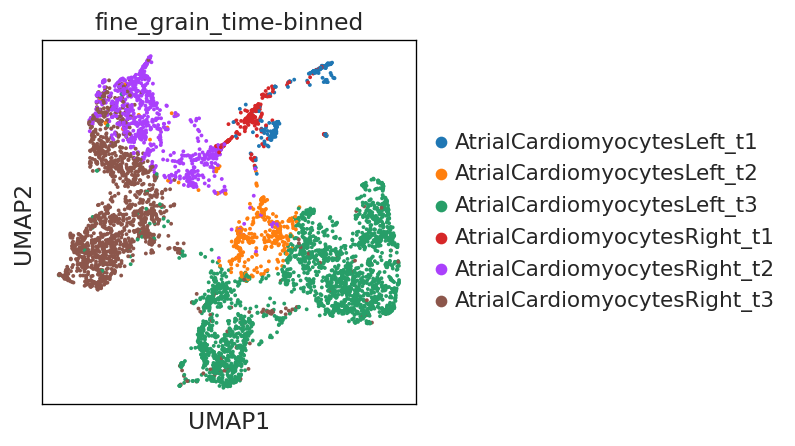

In [111]:
%matplotlib inline
# Check clustering data
celltype_col = 'fine_grain_time-binned'
sc.pl.umap(oracle.adata, color=celltype_col)

# Read in celloracle in-silico perturbation output

In [9]:
dev_dict = utils.read_pkl(path_to_res_dict)
print(len(dev_dict.keys()))
dev_dict.keys()

9


dict_keys(['ETS2', 'MAF', 'IKZF2', 'ETV6', 'BHLHE41', 'GTF2IRD1', 'GATA5', 'PITX2', 'SIX5'])

In [10]:
?dev.visualize_development_module_layout_0

Object `dev.visualize_development_module_layout_0` not found.


##### ETS2 #####


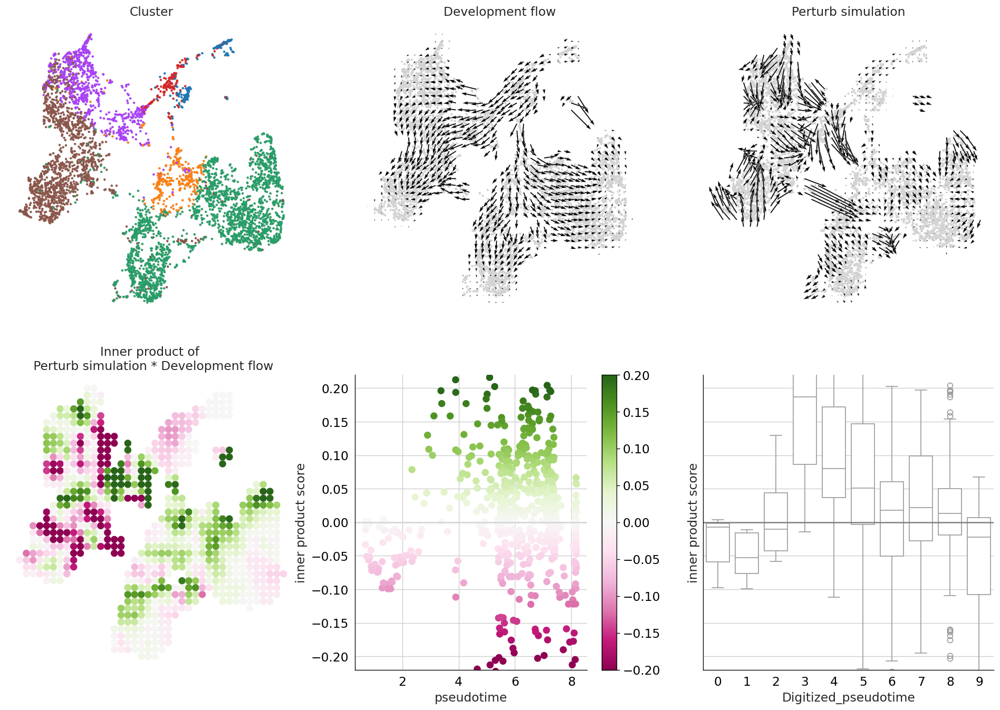

##### MAF #####


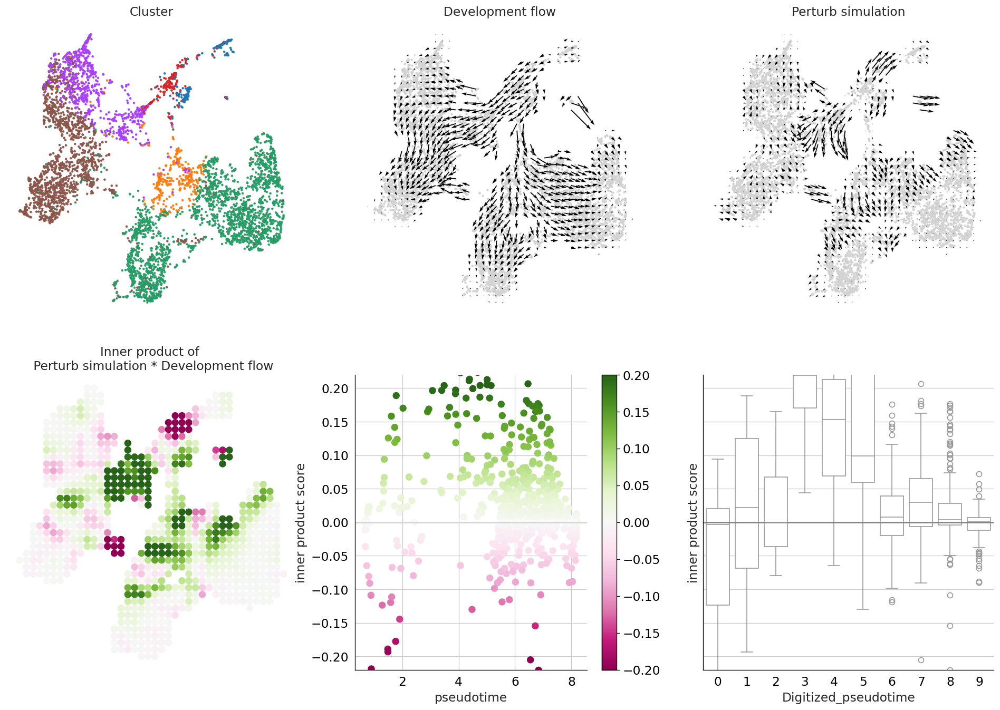

##### IKZF2 #####


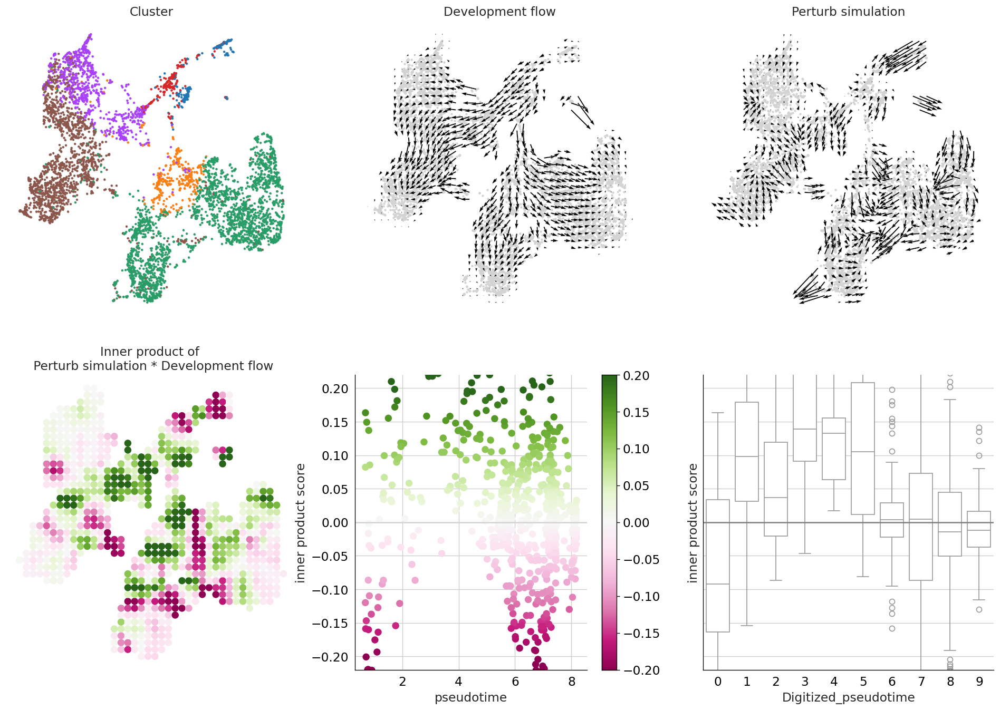

##### ETV6 #####


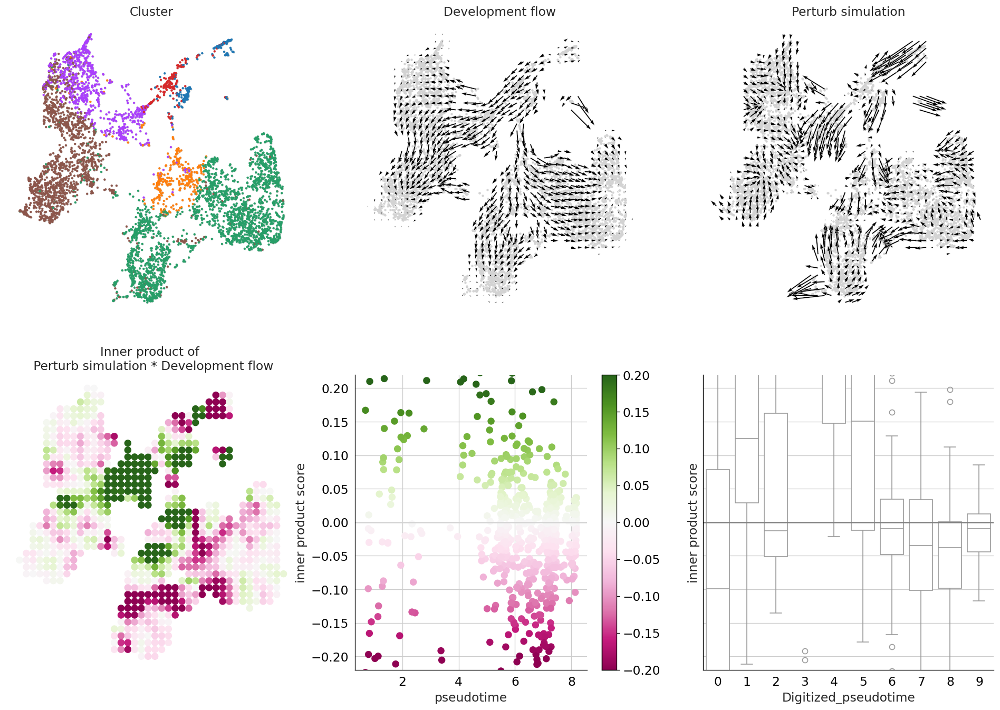

##### BHLHE41 #####


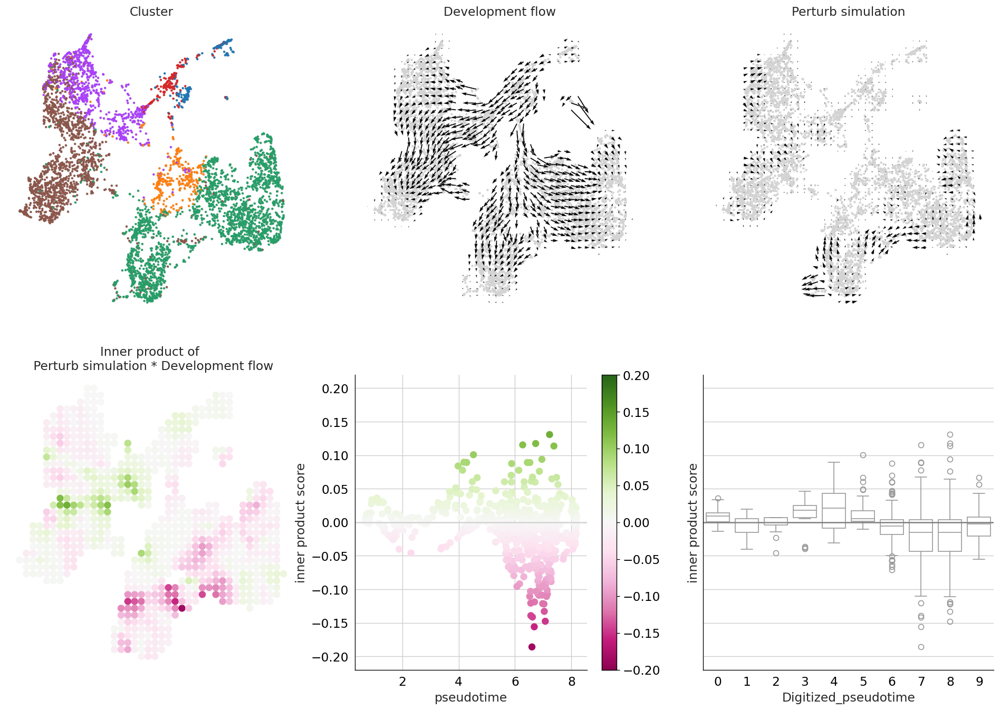

##### GTF2IRD1 #####


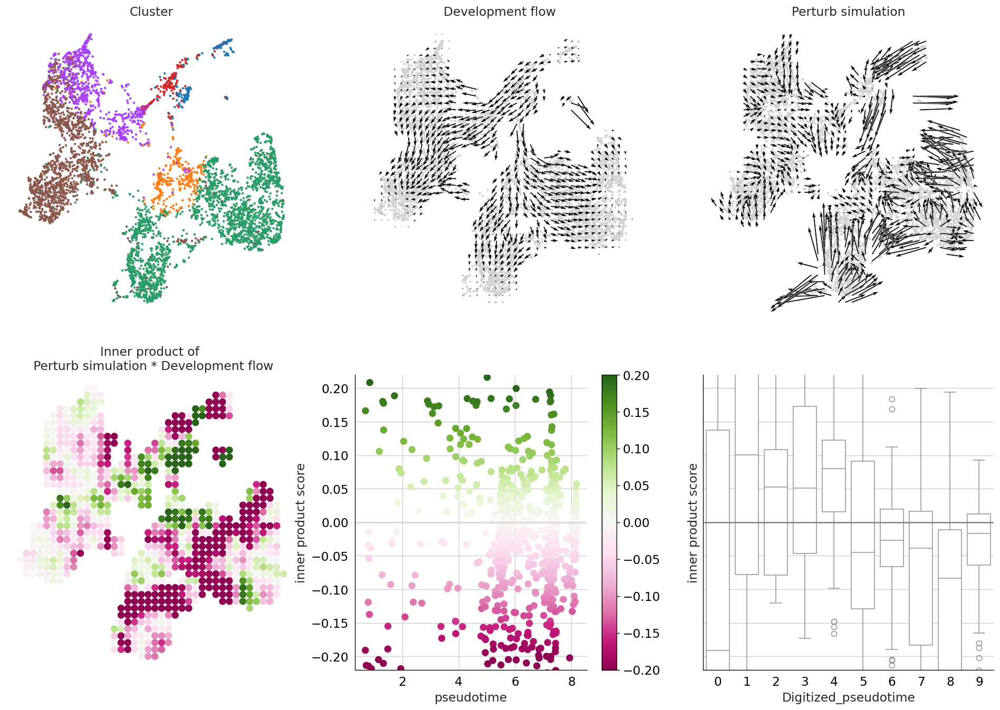

##### GATA5 #####


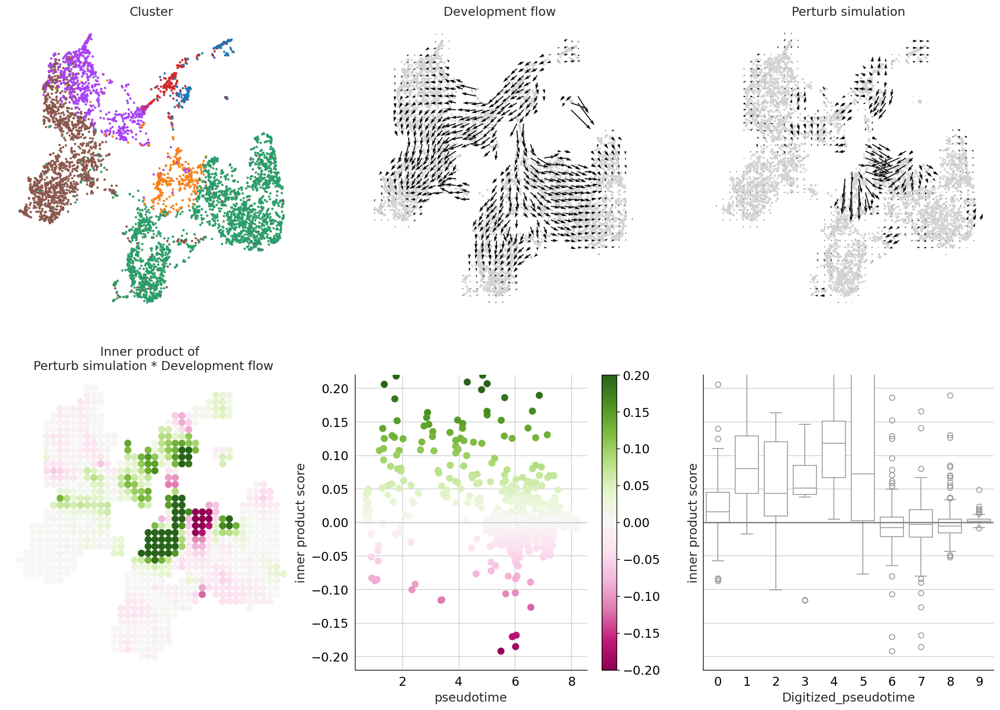

##### PITX2 #####


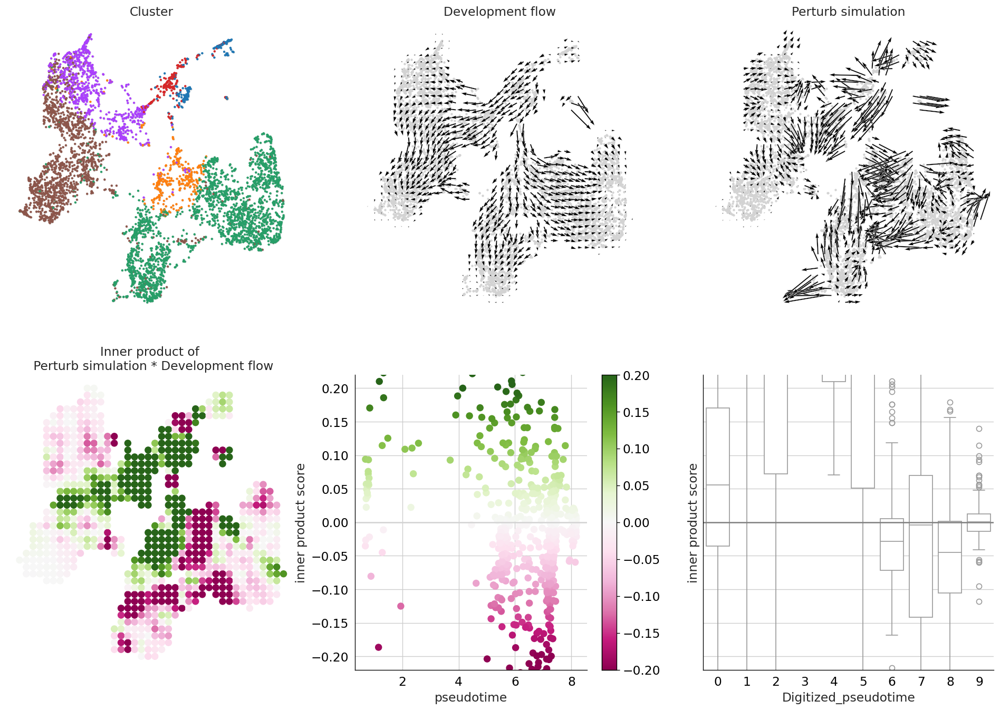

##### SIX5 #####


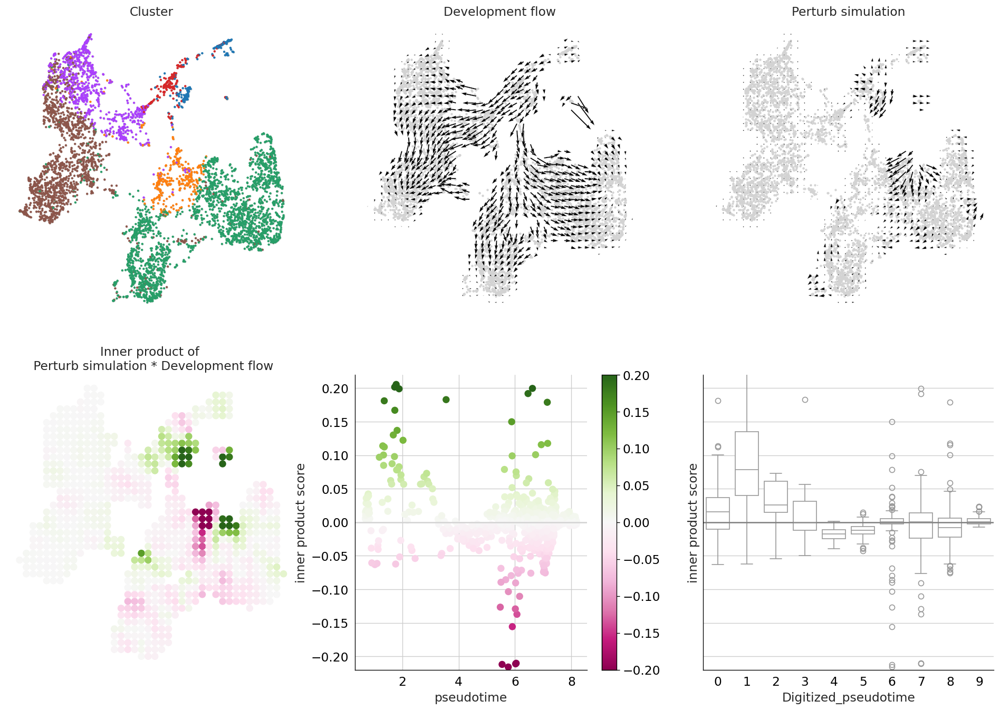

In [11]:
%matplotlib inline
# Hide all INFO (and DEBUG) messages from Matplotlib
import logging
logging.getLogger("matplotlib").setLevel(logging.WARNING)

vm = 0.2
scale_simulation = 5
scale_dev = 40

for tf in dev_dict.keys():
    dev = dev_dict[tf]
    print(f'##### {tf} #####')
    dev.visualize_development_module_layout_0(s=5,
                                              scale_for_simulation=scale_simulation,
                                              s_grid=50,
                                              scale_for_pseudotime=scale_dev,
                                              vm=vm)
    plt.show()

# Annotate grids

First we need to align cells and grids 

In [75]:
# pick one tf for assessing the alignment is correct
tf = 'PITX2'
dev = dev_dict[tf]

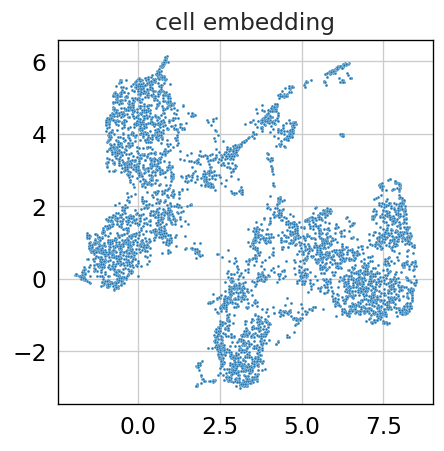

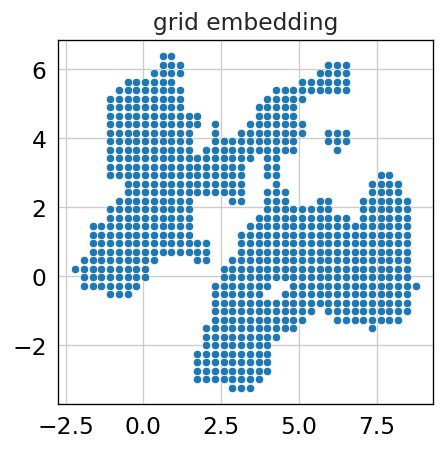

In [110]:
## let's make sure the obtained coordinates are making sense
# cell embedding
cell_embedding_coords = oracle.adata.obsm['X_umap'].copy()
sns.scatterplot(x=cell_embedding_coords[:,0],
                y=cell_embedding_coords[:,1],
                s=3
               )
plt.title('cell embedding')
plt.show()

# grid embedding
grid_embedding_coords = dev.gridpoints_coordinates[~dev.mass_filter_reference]
sns.scatterplot(x=grid_embedding_coords[:,0],
                y=grid_embedding_coords[:,1],
                s=25
               )
plt.title('grid embedding')
plt.show()

Looks ok

Next, lets give ID for each grid and make sure we are assigning the calculated inner product score correctly

##### PITX2 #####


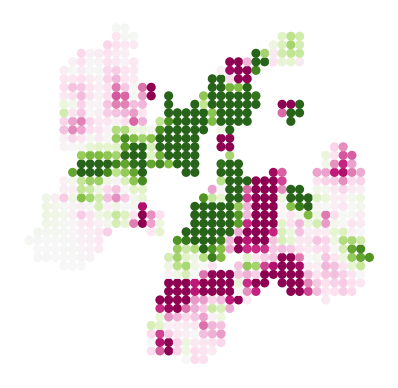

In [82]:
# groundtruth plot, same as above
print(f'##### {tf} #####')
dev.plot_inner_product_on_grid(vm=vm)
plt.show()

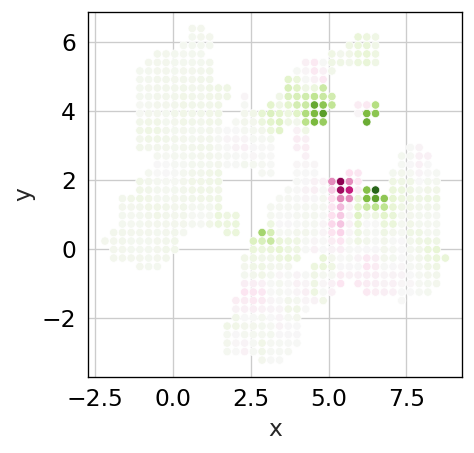

In [174]:
# align score with coordinates
inner_product_df = dev.inner_product_df.copy()
inner_product_df[['x','y']] = dev.gridpoints_coordinates[~dev.mass_filter_reference]

from matplotlib.colors import TwoSlopeNorm
x = inner_product_df['x']
y = inner_product_df['y']
c = inner_product_df['score']

# set up the norm so that 0 is centered
norm = TwoSlopeNorm(vmin=c.min(),
                    vcenter=0,
                    vmax=c.max())

sns.scatterplot(x=x,y=y,c=c,cmap='PiYG',hue_norm=norm,s=25)
plt.show()

looks ok

Next step is to annotate each grid

In [175]:
celltype_df = oracle.adata.obs[[celltype_col]].copy()
celltype_df[['x','y']] = oracle.adata.obsm['X_umap'].copy()
celltype_df

,fine_grain_time-binned,x,y
barcode,,,
BHF_F_Hea11933667_BHF_F_Hea11596620_CTTCTCAAGCGGTTAT-1,AtrialCardiomyocytesRight_t3,-0.846417,0.738098
BHF_F_Hea11933674_BHF_F_Hea11596627_GATTAGCTCAGCACGC-1,AtrialCardiomyocytesLeft_t2,4.258849,1.769809
BHF_F_Hea11933674_BHF_F_Hea11596627_CATGCAAGTTAGGTGC-1,AtrialCardiomyocytesLeft_t2,4.303827,2.085792
BHF_F_Hea11933668_BHF_F_Hea11596621_CCTTACTCAACACCTA-1,AtrialCardiomyocytesRight_t3,-0.419282,4.649668
BHF_F_Hea11933666_BHF_F_Hea11596619_AGCTTCCTCGTTATAG-1,AtrialCardiomyocytesLeft_t3,3.488628,-2.293432
...,...,...,...
BHF_F_Hea11064672_BHF_F_Hea11031825_GCACTTACAGCCAGAA-1,AtrialCardiomyocytesLeft_t3,5.088223,0.563129
BHF_F_Hea11933669_BHF_F_Hea11596622_GCTAACAGTTAGAGGG-1,AtrialCardiomyocytesRight_t2,0.561153,5.683398
BHF_F_Hea11933673_BHF_F_Hea11596626_GCCTATTGTGTGTCCC-1,AtrialCardiomyocytesRight_t1,4.185705,4.820168


In [176]:
# annotate grids
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors

def annotate_grid(cells_df, grid_df, k, celltype_col):
    """
    Annotate each grid point with the nearest cell_type label from cells_df.
    
    Parameters:
    - cells_df: DataFrame with columns ['x', 'y', celltype_col]
    - grid_df:  DataFrame with columns ['x', 'y']
    - k:        Number of nearest neighbors to consider (majority vote if k > 1)
    
    Returns:
    - grid_df with an added 'cell_type' column.
    """
    coords = cells_df[['x', 'y']].values
    nbrs = NearestNeighbors(n_neighbors=k).fit(coords)
    distances, indices = nbrs.kneighbors(grid_df[['x', 'y']].values)
    
    if k == 1:
        grid_df[celltype_col] = cells_df[celltype_col].values[indices.flatten()]
    else:
        # Majority vote over k neighbors
        labels = cells_df[celltype_col].values[indices]  # shape (n_grid, k)
        majority = []
        for row in labels:
            uniq, counts = np.unique(row, return_counts=True)
            majority.append(uniq[np.argmax(counts)])
        grid_df[celltype_col] = majority
    
    return grid_df

In [177]:
# to decide k
celltype_df.shape[0]/inner_product_df.shape[0]

7.52191235059761

In [178]:
celltype_labels = annotate_grid(cells_df=celltype_df, 
                                  grid_df=inner_product_df, 
                                  k=7,
                                  celltype_col=celltype_col)[celltype_col]
celltype_labels

0       AtrialCardiomyocytesLeft_t3
1       AtrialCardiomyocytesLeft_t3
2       AtrialCardiomyocytesLeft_t3
3       AtrialCardiomyocytesLeft_t3
4       AtrialCardiomyocytesLeft_t3
                   ...             
748     AtrialCardiomyocytesLeft_t1
749     AtrialCardiomyocytesLeft_t1
750     AtrialCardiomyocytesLeft_t1
751    AtrialCardiomyocytesRight_t2
752    AtrialCardiomyocytesRight_t2
Name: fine_grain_time-binned, Length: 753, dtype: object

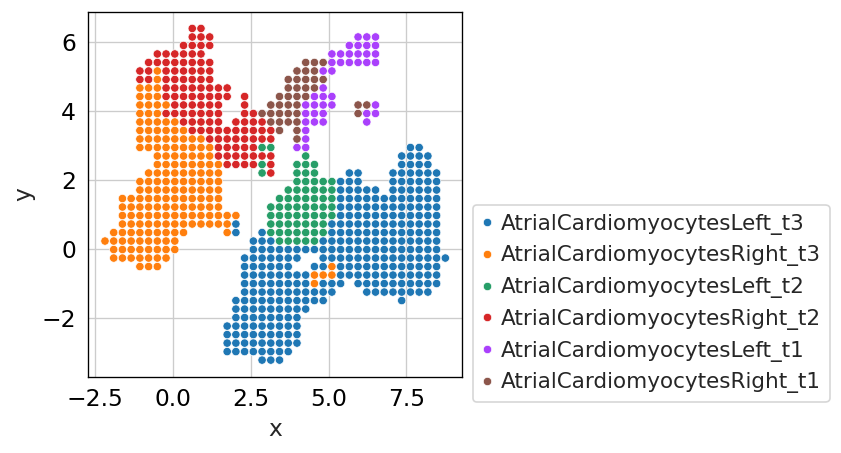

In [179]:
x = inner_product_df['x']
y = inner_product_df['y']
c = celltype_labels
sns.scatterplot(x=x,y=y,hue=c,s=25)
plt.legend(bbox_to_anchor=(1, 0.5))
plt.show()

# Plot heatmap of inner-product score

In [180]:
# update cell type name
df = pd.read_csv('/nfs/team205/heart/anndata_objects/Foetal/finegrain_name_mapping.csv')
celltype_mapping = df.set_index('Full_name')['Short_name_finalised'].to_dict()
celltype_labels_mod = [f'{celltype_mapping[x.split("_")[0]]}_{x.split("_")[1]}' for x in celltype_labels]
celltype_labels_mod[:5]

['aCML_t3', 'aCML_t3', 'aCML_t3', 'aCML_t3', 'aCML_t3']

In [181]:
# read in post-g2g-selection csv file and get selected TFs
# log2FC<0 means TFs specific to Right-aCM
# log2FC>0 means TFs specific to Left-aCM
g2g_sel = pd.read_csv('/nfs/team205/kk18/notebooks/Foetal/AtrialCM_celloracle/AtrialCM_post-g2g_selected-recgulons.csv')
display(g2g_sel)

# TFs, only activator
list_of_TFs = [x.split('_')[0] for x in g2g_sel['Gene'] if '_+' in x]
print(len(list_of_TFs))

,Gene,alignment_similarity_percentage,opt_alignment_cost,l2fc,color,abs_l2fc
0,ETS2_+,0.00,72.073285,-0.687252,red,0.687252
1,MAF_+,21.74,67.731430,-0.555707,red,0.555707
2,IKZF2_+,12.00,70.869309,0.353810,red,0.353810
3,ETV6_+,0.00,72.073285,0.439772,red,0.439772
4,BHLHE41_+,18.52,65.496091,0.450520,red,0.450520
5,GTF2IRD1_+,12.00,63.675774,0.452963,red,0.452963
6,GATA5_+,7.69,72.017812,0.545917,red,0.545917
7,PITX2_+,0.00,72.073285,0.684020,red,0.684020
8,SIX5_extended_+,21.74,61.395848,0.690589,red,0.690589
9,MAF_-,0.00,72.073285,1.296242,red,1.296242


9


In [192]:
for i,tf in enumerate(dev_dict.keys()):
    dev = dev_dict[tf]
    inner_product_df = dev.inner_product_df.copy()
    inner_product_df['TF'] = tf
    inner_product_df[celltype_col] = celltype_labels_mod
    if i==0:
        inner_product_df_all = inner_product_df.copy()
    else:
        inner_product_df_all = pd.concat([inner_product_df_all,inner_product_df])
inner_product_df_all

,score,score_randomized,pseudotime,pseudotime_id,TF,fine_grain_time-binned
0,0.013329,-0.001292,7.281787,8,ETS2,aCML_t3
1,0.012065,-0.002529,7.270744,8,ETS2,aCML_t3
2,0.005687,-0.001289,7.259819,8,ETS2,aCML_t3
3,-0.009803,-0.004748,7.262947,8,ETS2,aCML_t3
4,-0.017557,-0.007613,7.264366,8,ETS2,aCML_t3
...,...,...,...,...,...,...
748,0.036617,0.001733,0.759430,0,SIX5,aCML_t1
749,0.027087,0.001060,0.793185,0,SIX5,aCML_t1
750,0.014975,0.000406,0.797764,0,SIX5,aCML_t1
751,-0.000073,-0.000025,5.482108,6,SIX5,aCMR_t2


2025-05-13 17:05:12,591 - INFO - maxp pruned
2025-05-13 17:05:12,601 - INFO - cmap pruned
2025-05-13 17:05:12,603 - INFO - kern dropped
2025-05-13 17:05:12,604 - INFO - post pruned
2025-05-13 17:05:12,604 - INFO - FFTM dropped
2025-05-13 17:05:12,606 - INFO - GPOS pruned
2025-05-13 17:05:12,614 - INFO - GSUB pruned
2025-05-13 17:05:12,622 - INFO - glyf pruned
2025-05-13 17:05:12,625 - INFO - Added gid0 to subset
2025-05-13 17:05:12,627 - INFO - Added first four glyphs to subset
2025-05-13 17:05:12,627 - INFO - Closing glyph list over 'MATH': 44 glyphs before
2025-05-13 17:05:12,628 - INFO - Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'P', 'R', 'S', 'T', 'V', 'X', 'Z', 'a', 'b', 'd', 'e', 'f', 'five', 'four', 'g', 'hyphen', 'i', 'm', 'minus', 'n', 'nonmarkingreturn', 'one', 'r', 'six', 'space', 't', 'three', 'two', 'underscore', 'zero']
2025-05-13 17:05:12,629 - INFO - Glyph IDs:   [0, 1, 2, 3, 16, 19, 20, 21, 22, 23, 24, 25, 36, 37, 38,

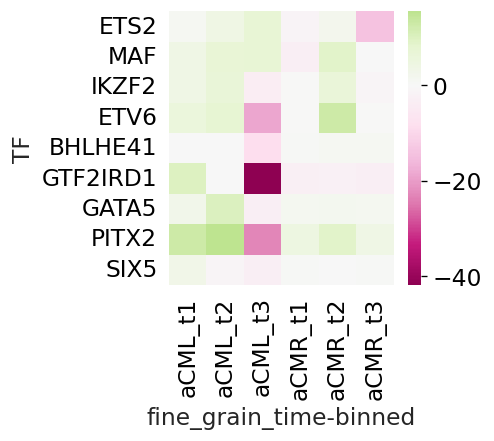

In [193]:
aggr_df = inner_product_df_all[['score','TF',celltype_col]].groupby(['TF',celltype_col]).sum() # "sum", so this is reflecting the number of grids (cells)
aggr_df = aggr_df.reset_index()
df = aggr_df.pivot(index='TF',columns=celltype_col,values='score')
# reorder based on g2g-log2FC values
df = df.loc[list_of_TFs.rev]

plt.rcParams['figure.figsize'] = 3,3
sns.heatmap(df, center=0, cmap='PiYG')
plt.savefig(f"{figdir}/AtrialCM_CellOracle_heatmap.pdf", bbox_inches="tight",dpi=300)
plt.show()